In [1]:
#This code generates the files for differentiating matrix and tensor methods 
#with simplified tensor structures

In [3]:
#imports 
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE
from tensorly.decomposition import non_negative_parafac
import tensorly as tl
from scipy.linalg import svd
from sklearn.manifold import TSNE
import textwrap
from matplotlib.colors import LinearSegmentedColormap
import h5py
from sklearn.decomposition import NMF
from numpy.linalg import svd
import scipy.io
import umap
import seaborn as sns
from scipy.stats import zscore
from tensorly import tensor as tl_tensor
import random

In [6]:
n_blocks = 6
small_block_size = 10

In [ ]:
#This block creates the block tensors
np.random.seed(42)

def generate_block_tensors(n_blocks, small_block_size, noise_level=0.05):
    n = n_blocks * small_block_size
    block_tensor_continuous = np.zeros((n, n, n))
    block_tensor_solid = np.zeros((n, n, n))
    
    #np.random.uniform(0, 1, (n, n, n))  # continuous values between 0 and 1
    
    # Fill the main diagonal blocks
    for i in range(0, n, small_block_size):
        choice1 = 1
        block_tensor_solid[i:i+small_block_size, i:i+small_block_size, i:i+small_block_size] = choice1
        if choice1 == 1:
            for x in range(i, i+small_block_size):
                for y in range(i, i+small_block_size):
                    for z in range(i, i+small_block_size):
                        block_tensor_continuous[x, y, z] = random.uniform(0, 1)
                        
        choice2 = 1
        block_tensor_solid[i:2*small_block_size, i+small_block_size:i+2*small_block_size, i+small_block_size:i+2*small_block_size] = choice2
        if choice2 == 1:
            for x in range(i, 2*small_block_size):
                for y in range(i+small_block_size, i+2*small_block_size):
                    for z in range(i+small_block_size, i+2*small_block_size):
                        block_tensor_continuous[x, y, z] = random.uniform(0, 1)
    
   # Fill the 'floor' diagonal blocks
    for i in range(0, n, small_block_size):
        end_idx = n - i - small_block_size
        if end_idx >= 0:
            block_tensor_solid[i+small_block_size:i+2*small_block_size, i:i+2*small_block_size, max(end_idx, 0):min(end_idx+2*small_block_size, n)] = 1
            for x in range(i+small_block_size, min(i+2*small_block_size, n)):
                for y in range(i, min(i+2*small_block_size, n)):
                    for z in range(max(end_idx, 0), min(end_idx+2*small_block_size, n)):
                        block_tensor_continuous[x, y, z] = random.uniform(0, 1)

            #block_tensor[i+small_block_size:i+3*small_block_size, i:i+3*small_block_size, end_idx:end_idx+3*small_block_size] = 1
            #for x in range(i+small_block_size, i+3*small_block_size):
            #    for y in range(i,i+3*small_block_size):
            #        for z in range(end_idx, end_idx+3*small_block_size):
            #            block_tensor_nonsolid[x, y, z] = random.choice([0, 1])

    for i in range(0, n, small_block_size):
        choice5 = 1

        end_idx = n - small_block_size - i
        if end_idx < 0:
            end_idx = 0

        if i + small_block_size <= n:
            block_tensor_solid[i:i + small_block_size, end_idx:end_idx + small_block_size, i:i + small_block_size] = choice5
            if choice5 == 1:
                block_tensor_continuous[i:i + small_block_size, end_idx:end_idx + small_block_size, i:i + small_block_size] = np.random.uniform(0, 1, size=(small_block_size, small_block_size, small_block_size))

        if i + 4 * small_block_size <= n and end_idx + 4 * small_block_size <= n:
            block_tensor_solid[i:i + 4 * small_block_size, end_idx:end_idx + 4 * small_block_size, i:i + 4 * small_block_size] = choice5
            if choice5 == 1:
                block_tensor_continuous[i:i + 4 * small_block_size, end_idx:end_idx + 4 * small_block_size, i:i + 4 * small_block_size] = np.random.uniform([0, 1], size=(4 * small_block_size, 4 * small_block_size, 4 * small_block_size))                       

    # Generate color vector for the tensor columns
    color_vector = np.repeat(np.arange(n_blocks), small_block_size)

    noise = np.random.normal(0, noise_level, (n, n, n))
    positive_noise = np.abs(noise)
    block_tensor_continuous += positive_noise 
    
    return color_vector, block_tensor_continuous, block_tensor_solid

color_vector, block_tensor_continuous, block_tensor_solid = generate_block_tensors(n_blocks, small_block_size)
block_tensor_binarized = (block_tensor_continuous > 0.3).astype(int)

# Create a 3D array for colors
n = block_tensor_continuous.shape[0]
colors = np.zeros((n, n, n, 4))  # 4 for RGBA colors
cmap = plt.get_cmap('tab10')

# Apply colors based on color_vector (color by sample, X-axis)
for i in range(n):
    colors[i, :, :] = cmap(color_vector[i] / max(color_vector))



In [ ]:
#Plot 3D Figures of the tensors

fontsize1 = 35
fontsize2 = 25

# Set up the figure and axes
fig = plt.figure(figsize=(30, 15), dpi=200)
ax1 = fig.add_subplot(1, 3, 1, projection='3d')
ax2 = fig.add_subplot(1, 3, 2, projection='3d')
ax3 = fig.add_subplot(1, 3, 3, projection='3d')

# Plot 1: Continuous Block Tensor
cmap_continuous = plt.get_cmap('viridis')
norm_continuous = plt.Normalize(0, 1)
colors_continuous = cmap_continuous(norm_continuous(block_tensor_continuous))
voxels_continuous = block_tensor_continuous != 0
ax1.voxels(voxels_continuous, facecolors=colors_continuous, edgecolors='k', alpha=1)
ax1.set_title(r'$\bf{(a)}$' + f'\nOriginal Tensor\nColored By Value\n\n', fontsize=fontsize1)
ax1.set_xlabel('Cells', fontsize=fontsize2)
ax1.set_ylabel('Genes', fontsize=fontsize2)
ax1.set_zlabel('Modalities', fontsize=fontsize2)

# Colorbar for Plot 1
mappable_continuous = plt.cm.ScalarMappable(norm=norm_continuous, cmap=cmap_continuous)
mappable_continuous.set_array([])
cbar_continuous = plt.colorbar(mappable_continuous, ax=ax1, shrink=0.6, aspect=20, pad = .1)
cbar_continuous.set_label('Value', fontsize=fontsize2)

# Plot 2: Binarized Block Tensor
voxels_binarized = block_tensor_binarized != 0
ax2.voxels(voxels_binarized, facecolors=colors, edgecolors='k', alpha=1)
ax2.set_title(r'$\bf{(b)}$'+ f'\nBinarized 0-1 Tensor\nColored By Natural Grouping\n', fontsize=fontsize1)
ax2.set_xlabel('Cells', fontsize=fontsize2)
ax2.set_ylabel('Genes', fontsize=fontsize2)
ax2.set_zlabel('Modalities', fontsize=fontsize2)

# Plot 3: Solid Block Tensor
voxels_solid = block_tensor_solid != 0
ax3.voxels(voxels_solid, facecolors=colors, edgecolors='k', alpha=1)
ax3.set_title(r'$\bf{(c)}$' + f'\nBinarized 1-0 Tensor\nImputed into Solid Blocks\nColored By Natural Grouping', fontsize=fontsize1, pad=20)
ax3.set_xlabel('Cells', fontsize=fontsize2)
ax3.set_ylabel('Genes', fontsize=fontsize2)
ax3.set_zlabel('Modalities', fontsize=fontsize2)

# Set the overall figure title and adjust layout
#fig.suptitle(f'Synthetic Data: Six Cell Types Simulation', fontsize=40, y=0.95, weight='bold')
fig.subplots_adjust(top=0.80, bottom=0.20)

# Add caption text
# Caption text
caption_text = (
    r"$\bf{Figures\ 4a,4b,4c. \ These \ 3D \ plots \ depict \ synthetic \ data \ from \ a \ simulation \ of \ data \ from \ six \ cell \ types.}$"
    " Plot (a) shows the actual tensor of data with each entry colored "
    "according to its value. The six cells types are difficult to visually distinguish in "
    "this image because of noise in the data. "
    "Plot (b) shows a binarized version of the tensor in (a). Here, entries above a threshold of "
    "0.3 are set to 1 and colored according to their natural grouping. Entries below the threshold "
    "are set to 0 and are transparent. This binarization demonstrates visually that the "
    "original tensor has six types of cells. Each blue matrix slice, for example, is more similar to any "
    "other blue matrix slice than to any yellow matrix slice. "
    "Plot (c) shows an imputed version of the binarized tensor in (b). The imputation step first identifies "
    "blocks in the data. Next, 0 values inside of blocks are set to 1, and all the nonzero values outside "
    "of blocks are set to 0. "
    "This binarized and imputed 0-1 block tensor is most well-suited for matrix unfolding. "
)
plt.figtext(0.01, 0.01, caption_text, ha='left', fontsize=fontsize1-5, wrap=True)
plt.show()


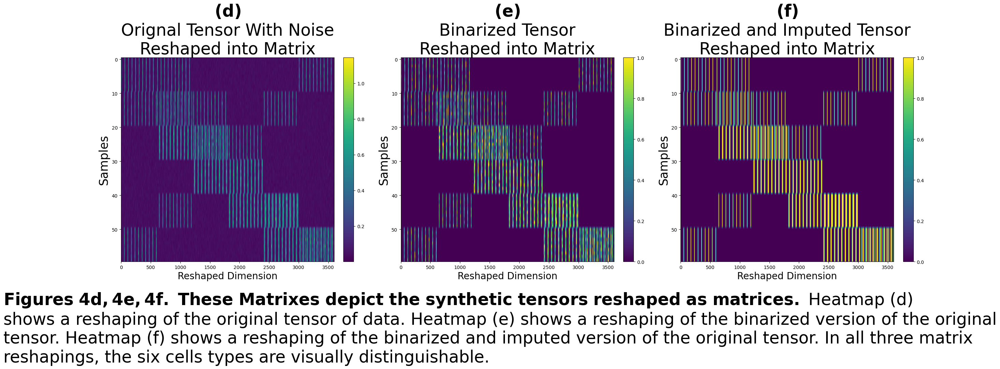

In [6]:
fontsize1 = 35
fontsize2 = 25

#Unfold the tensors and view the results

matrix_reshaped_continuous = block_tensor_continuous.reshape((n_blocks * small_block_size, -1))
matrix_reshaped_binarized = block_tensor_binarized.reshape((n_blocks * small_block_size, -1))
matrix_reshaped_solid = block_tensor_solid.reshape((n_blocks * small_block_size, -1))

fig = plt.figure(figsize=(30, 12))
ax1 = fig.add_subplot(1, 3, 1)
matshow_1 = ax1.imshow(matrix_reshaped_continuous, cmap='viridis', aspect='auto')
ax1.set_title(r'$\bf{(d)}$' +f'\nOrignal Tensor With Noise\nReshaped into Matrix', fontsize=fontsize1)
ax1.set_xlabel('Reshaped Dimension', fontsize = 20)
ax1.set_ylabel('Samples', fontsize=fontsize2)
plt.colorbar(matshow_1, ax=ax1, fraction=0.046, pad=0.04)

ax2 = fig.add_subplot(1, 3, 2)
matshow_2 = ax2.imshow(matrix_reshaped_binarized, cmap='viridis', aspect='auto')
ax2.set_title(r'$\bf{(e)}$' + f'\nBinarized Tensor\nReshaped into Matrix', fontsize=fontsize1)
ax2.set_xlabel('Reshaped Dimension', fontsize = 20)
ax2.set_ylabel('Samples', fontsize=fontsize2)
plt.colorbar(matshow_2, ax=ax2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 3, 3)
matshow_3 = ax3.imshow(matrix_reshaped_solid, cmap='viridis', aspect='auto')
ax3.set_title(r'$\bf{(f)}$' + f'\nBinarized and Imputed Tensor\nReshaped into Matrix', fontsize=fontsize1)
ax3.set_xlabel('Reshaped Dimension', fontsize = 20)
ax3.set_ylabel('Samples', fontsize=fontsize2)
plt.colorbar(matshow_3, ax=ax3, fraction=0.046, pad=0.04)

# Set the overall figure title and adjust layout
#fig.suptitle(f'Synthetic Data: Six Cell Types Simulation', fontsize=40, y=0.95, weight='bold')
fig.subplots_adjust(top=0.75, bottom=0.25)

# Add caption text
# Caption text
caption_text = (
    r"$\bf{Figures\ 4d,4e,4f. \ These \ Matrixes \ depict \ the \ synthetic \ tensors \ reshaped \ as \ matrices.}$"
    " Heatmap (d) shows a reshaping of the original tensor of data. "
    "Heatmap (e) shows a reshaping of the binarized version of the original tensor. "
    "Heatmap (f) shows a reshaping of the binarized and imputed version of the original tensor. "
    "In all three matrix reshapings, the six cells types are visually distinguishable."
)
plt.figtext(0.01, 0.01, caption_text, ha='left', fontsize=fontsize1, wrap=True)
plt.show()

In [9]:
#parameters for decomposition
rank = 60
n_iter = 400

In [8]:
#perform the tensor factorization in tensorly
import tensorly as tl
from tensorly.decomposition import non_negative_parafac

# Ensure the tensors are in floating point format
block_tensor_continuous = block_tensor_continuous.astype('float32')
#block_tensor_binarized = block_tensor_binarized.astype('float32')

factors = non_negative_parafac(block_tensor_continuous, rank=rank, n_iter_max=n_iter, init='random')
#factors_binarized = non_negative_parafac(block_tensor_binarized, rank=rank, n_iter_max=n_iter, init='random')


In [9]:
# Non-negative Matrix Factorization in scikitlearn
nmf = NMF(n_components=rank, init='random', random_state=0, max_iter=n_iter)
W = nmf.fit_transform(matrix_reshaped_continuous)
H = nmf.components_

#nmf = NMF(n_components=rank, init='random', random_state=0, max_iter=n_iter)
#W_binarized = nmf.fit_transform(matrix_reshaped_binarized)
#H_binarized = nmf.components_

nmf = NMF(n_components=rank, init='random', random_state=0, max_iter=n_iter)
W_binarized_imputed = nmf.fit_transform(matrix_reshaped_solid)
H_binarized_imputed = nmf.components_

In [10]:
#Compute the TSNE of matrix and tensor factors
perplexity = 5

tensor_factors = factors.factors[0]
#tensor_factors_binarized = factors_binarized.factors[0]

tsne = TSNE(n_components=2, perplexity=perplexity)
tensor_tsne = tsne.fit_transform(tensor_factors)
#tensor_binarized_tsne = tsne.fit_transform(tensor_factors_binarized)
matrix_tsne = tsne.fit_transform(W)
matrix_binarized_imputed_tsne = tsne.fit_transform(W_binarized_imputed)

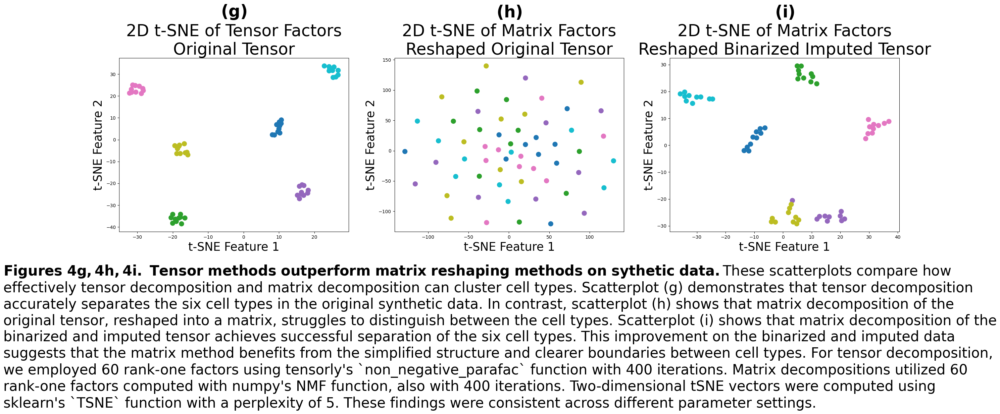

In [11]:
fontsize1 = 35
fontsize2 = 25

# Creating the plots
fig = plt.figure(figsize=(30, 14))

# Plot 1: 2D t-SNE of Tensor Factors of Continuous Tensor
ax1 = fig.add_subplot(1, 3, 1)
scatter = ax1.scatter(tensor_tsne[:, 0], tensor_tsne[:, 1],  c=color_vector, cmap = plt.get_cmap('tab10'), s=100)
ax1.set_title(r'$\bf{(g)}$' + f'\n2D t-SNE of Tensor Factors\nOriginal Tensor', fontsize=fontsize1)
ax1.set_xlabel('t-SNE Feature 1', fontsize=fontsize2)
ax1.set_ylabel('t-SNE Feature 2', fontsize=fontsize2)

# Plot 2: 2D t-SNE of Matrix Factors of Unfolded Continuous Tensor
ax2 = fig.add_subplot(1, 3, 2)
scatter = ax2.scatter(matrix_tsne[:, 0], matrix_tsne[:, 1],  c=color_vector, cmap = plt.get_cmap('tab10'), s=100)
ax2.set_title(r'$\bf{(h)}$' + f'\n2D t-SNE of Matrix Factors\nReshaped Original Tensor', fontsize=fontsize1)
ax2.set_xlabel('t-SNE Feature 1', fontsize=fontsize2)
ax2.set_ylabel('t-SNE Feature 2', fontsize=fontsize2)

# Plot 3: 2D t-SNE of Matrix Factors of Unfolded Binarized Tensor
ax3 = fig.add_subplot(1, 3, 3)
scatter = ax3.scatter(matrix_binarized_imputed_tsne[:, 0], matrix_binarized_imputed_tsne[:, 1],  c=color_vector, cmap = plt.get_cmap('tab10'), s=100)
ax3.set_title(r'$\bf{(i)}$' + f'\n2D t-SNE of Matrix Factors\nReshaped Binarized Imputed Tensor', fontsize=fontsize1)
ax3.set_xlabel('t-SNE Feature 1', fontsize=fontsize2)
ax3.set_ylabel('t-SNE Feature 2', fontsize=fontsize2)

# Caption text
caption_text = (
    r"$\bf{Figures\ 4g,4h,4i. \ Tensor \ methods \ outperform \ matrix \ reshaping \ methods \ on \ sythetic \ data.}$"
    "These scatterplots compare how effectively tensor decomposition and matrix decomposition can cluster cell types. "
    "Scatterplot (g) demonstrates that tensor decomposition accurately separates the six cell types in the original synthetic data. "
    "In contrast, scatterplot (h) shows that matrix decomposition of the original tensor, reshaped into a matrix, struggles to distinguish between the cell types. "
    "Scatterplot (i) shows that matrix decomposition of the binarized and imputed tensor achieves successful separation of the six cell types. "
    "This improvement on the binarized and imputed data suggests that the matrix method benefits from the simplified structure and clearer boundaries between cell types. "
    "For tensor decomposition, we employed 60 rank-one factors using tensorly's `non_negative_parafac` function with 400 iterations. "
    "Matrix decompositions utilized 60 rank-one factors computed with numpy's NMF function, also with 400 iterations. "
    "Two-dimensional tSNE vectors were computed using sklearn's `TSNE` function with a perplexity of 5. "
    "These findings were consistent across different parameter settings."
)

# Set the overall figure title and adjust layout
#fig.suptitle(f'Synthetic Data: Six Cell Types Simulation', fontsize=40, y=0.95, weight='bold')
fig.subplots_adjust(top=0.75, bottom=0.38)

# Adjust the position of the caption if necessary
plt.figtext(0.01, 0.01, caption_text, ha='left', fontsize=fontsize1-5, wrap=True)
plt.show()



In [12]:
#Save all the variable

# Saving block_tensor to an HDF5 file
file_path = f'/home/dwk681/workspace/grant/examples/block_tensors_small_{small_block_size}_total_{n_blocks}_environment.h5'
    
# Save the arrays to an HDF5 file
with h5py.File(file_path, 'w') as h5f:
    h5f.create_dataset('block_tensor_continuous', data=block_tensor_continuous)
    h5f.create_dataset('block_tensor_binarized', data=block_tensor_binarized)
    h5f.create_dataset('block_tensor_solid', data=block_tensor_solid)
    h5f.create_dataset('colors', data=colors)
    h5f.create_dataset('color_vector', data=color_vector)
    h5f.create_dataset('matrix_reshaped_continuous', data=matrix_reshaped_continuous)
    h5f.create_dataset('matrix_reshaped_binarized', data=matrix_reshaped_binarized)
    h5f.create_dataset('matrix_reshaped_solid', data=matrix_reshaped_solid)
    h5f.create_dataset('tensor_factors', data=tensor_factors)
    h5f.create_dataset('tensor_tsne', data=tensor_tsne)
    h5f.create_dataset('matrix_tsne', data=matrix_tsne)
    h5f.create_dataset('matrix_binarized_imputed_tsne', data=matrix_binarized_imputed_tsne)

print(f'Datasets saved to {file_path}')   

Datasets saved to /home/dwk681/workspace/grant/examples/block_tensors_small_10_total_6_environment.h5


In [7]:
# If the variables are no longer in the enviroment, load them with this block
# Specify the path to the HDF5 file
file_path = f'/home/dwk681/workspace/grant/examples/block_tensors_small_{small_block_size}_total_{n_blocks}_environment.h5'

# Load the arrays from the HDF5 file
with h5py.File(file_path, 'r') as h5f:
    block_tensor_continuous = h5f['block_tensor_continuous'][:]
    block_tensor_binarized = h5f['block_tensor_binarized'][:]
    block_tensor_solid = h5f['block_tensor_solid'][:]
    colors = h5f['colors'][:]
    color_vector = h5f['color_vector'][:]
    matrix_reshaped_continuous = h5f['matrix_reshaped_continuous'][:]
    matrix_reshaped_binarized = h5f['matrix_reshaped_binarized'][:]
    matrix_reshaped_solid = h5f['matrix_reshaped_solid'][:]
    tensor_factors = h5f['tensor_factors'][:]
    tensor_tsne = h5f['tensor_tsne'][:]
    matrix_tsne = h5f['matrix_tsne'][:]
    matrix_binarized_imputed_tsne = h5f['matrix_binarized_imputed_tsne'][:]

print('Datasets loaded from', file_path)


Datasets loaded from /home/dwk681/workspace/grant/examples/block_tensors_small_10_total_6_environment.h5


In [11]:
#Combined 3 by 3 image

fontsize1 = 40
fontsize2 = 30

# Set up the figure and axes
fig = plt.figure(figsize=(30, 30), dpi=300)

ax1 = fig.add_subplot(2, 2, 1, projection='3d')
ax2 = fig.add_subplot(2, 2, 2, projection='3d')

# Plot 1: Binarized Block Tensor
voxels_binarized = block_tensor_binarized != 0
ax1.voxels(voxels_binarized, facecolors=colors, edgecolors='k', alpha=1)
ax1.set_title(f'\nBinarized 0-1 Tensor\nColored By Natural Grouping\n', fontsize=fontsize1)
ax1.set_xlabel('Cells', fontsize=fontsize2)
ax1.set_ylabel('Genes', fontsize=fontsize2)
ax1.set_zlabel('Modalities', fontsize=fontsize2)

# Plot 2: Solid Block Tensor
voxels_solid = block_tensor_solid != 0
ax2.voxels(voxels_solid, facecolors=colors, edgecolors='k', alpha=1)
ax2.set_title(f'\nBinarized 1-0 Tensor\nImputed into Solid Blocks\nColored By Natural Grouping', fontsize=fontsize1, pad=20)
ax2.set_xlabel('Cells', fontsize=fontsize2)
ax2.set_ylabel('Genes', fontsize=fontsize2)
ax2.set_zlabel('Modalities', fontsize=fontsize2)

# Plot 3: 2D t-SNE of Matrix Factors of Unfolded Continuous Tensor
ax3 = fig.add_subplot(2, 2, 3)
scatter = ax3.scatter(matrix_tsne[:, 0], matrix_tsne[:, 1],  c=color_vector, cmap = plt.get_cmap('tab10'), s=200)
ax3.set_title(f'\n2D t-SNE of Matrix Factors\nReshaped Original Tensor', fontsize=fontsize1)
ax3.set_xlabel('t-SNE Feature 1', fontsize=fontsize2)
ax3.set_ylabel('t-SNE Feature 2', fontsize=fontsize2)

# Plot 4: 2D t-SNE of Matrix Factors of Unfolded Binarized Tensor
ax4 = fig.add_subplot(2, 2, 4)
scatter = ax4.scatter(matrix_binarized_imputed_tsne[:, 0], matrix_binarized_imputed_tsne[:, 1],  c=color_vector, cmap = plt.get_cmap('tab10'), s=200)
ax4.set_title(f'\n2D t-SNE of Matrix Factors\nReshaped Binarized Imputed Tensor', fontsize=fontsize1)
ax4.set_xlabel('t-SNE Feature 1', fontsize=fontsize2)
ax4.set_ylabel('t-SNE Feature 2', fontsize=fontsize2)

#fig.patch.set_edgecolor('black')
#fig.patch.set_linewidth(5)

# Adjust space between subplots
#fig.subplots_adjust(hspace=0.35)
fig.subplots_adjust(top=0.86)

# Add a caption
caption = (
    r"$\bf{Figure \ 5:}$ Matrix methods are comparable to tensor methods for data with a simple structure, "
    f"such as data with clear boundaries "
    f"between cell types. For this simulation, a cells by genes by modalities tensor was constructed with six cell types. "
    f"Matrix reshaping methods performed as well as tensor methods at clustering the cells into cell types once the data " 
    f"was binarized and inputed to make clear boundaries between cell types."
    "\n\n"
    r"$\bf{Top \ left:}$ This plot shows a binarized version of a tensor of synthetic data. Here, entries above a threshold "
    f"are set to 1 and colored according to their natural grouping. Entries below the threshold are set to 0 and are transparent. "
    f"This binarization demonstrates visually that the original tensor has six types of cells. Each blue matrix slice, for example, "
    f"is more similar to any other blue matrix slice than to any yellow matrix slice. "
    "\n\n"
    r"$\bf{Top \ right:}$ This plot shows an imputed version of the binarized tensor in the top left plot. The imputation "
    f"step first identifies blocks in the data. Next, 0 values inside of blocks are set to 1, and all the "
    f"nonzero values outside of blocks are set to 0. This binarized and imputed 0-1 block tensor is most "
    f"well-suited for methods that reshape tensor data into a matrix. "
    "\n\n"
    r"$\bf{Bottom \ left:}$ This scatterplot shows that matrix decomposition of the binarized tensor, "
    f"reshaped into a matrix, struggles to distinguish between the cell types. "
    "\n\n"
    r"$\bf{Bottom \ right:}$ This scatterplot shows that matrix decomposition of the binarized and imputed tensor achieves "
    f"successful separation of the six cell types. This improvement on the binarized and imputed data suggests that "
    f"the matrix method benefits from the simplified structure and clearer boundaries between cell types. "
    "\n\n"
    f"For these matrix decompositions, "
    f"{rank} rank one factors were computed with `NMF` function from the python package `numpy` with 400 iterations. "
    "All of the results of this figure were consistent across different parameter settings."
)

fig.text(0.01, -0.52, caption, ha='left', fontsize=fontsize1, wrap=True)

# Add a single frame around the title and subtitle
fig.text(0.5, 1.04, r"$\bf{Figure \ 5:}$"+f"\nMatrix Methods Are Comparable To\nTensor Methods With Simplified Data",
         ha='center', va='top', fontsize=40, bbox=dict(facecolor='white', edgecolor='black', boxstyle="round,pad=1.0"))

plt.savefig('Block_Tensor_Example_new.png', dpi=200, bbox_inches='tight', pad_inches=1)
plt.show()


In [16]:
#Alternatively the tensor decomposition could have been done with tensorlab
#Should perform in tensorlab as well to make sure it agrees
#parameters here need to be updated

#I should try to rewrite all this code in python

#!/bin/bash

#SBATCH --account=b1042
#SBATCH --partition=genomics
#SBATCH --time=5:00:00
#SBATCH --ntasks=5
#SBATCH --mem=150000
#SBATCH --error=/home/dwk681/workspace/codeForPublicationImages/logs/%JgetStructuredDataLog.err
#SBATCH --output=/home/dwk681/workspace/codeForPublicationImages/logs/%JgetStructuredDataLog.out


module load matlab/r2022b

# Set the path for data storage
data_path="/home/dwk681/workspace/codeForPublicationImages"

# Start of MATLAB code
matlab -nodisplay -nosplash << MATLAB_SCRIPT
% MATLAB code here
path = '$data_path';

addpath(genpath('/home/dwk681/workspace/softwareFiles/tensorlab'));

        filename = '/home/dwk681/workspace/codeForPublicationImages/data/block_tensors_small_5_total_10.h5';
        data = h5read(filename, '/block_tensor');
        r = 60;
        sol_factors = cell(1,r);
        ranks = 1:r;

        n = size(data, 1);
        m = size(data, 2);
        p = size(data, 3);

     % Factorization loop
     i = 60;
         model = struct;
         model.variables.u = rand(n, i);
         model.variables.v = rand(m, i);
         model.variables.w = rand(p, i);
         model.factors.U = {'u', @struct_nonneg};
         model.factors.V = {'v', @struct_nonneg};
         model.factors.W = {'w', @struct_nonneg};
         model.factorizations.myfac.data = data;
         model.factorizations.myfac.cpd = {'U', 'V', 'W'};
         options.Display = 100;
         options.MaxIter = 200;
         sol = sdf_nls(model, options);
         sol_factors{1, i} = {sol.factors.U, sol.factors.V, sol.factors.W};

 % Save the processed data
output_file = sprintf('%s/Workspaces/block_tensor_200iterations_rank60_nosymmetry_solid_5_by_10.mat', path);
save(output_file);

MATLAB_SCRIPT         

#Subsequently extract results from matlab in the follwiing way 
mat_file_path = '/home/dwk681/workspace/grant/block_tensor_400iterations_rank60_nosymmetry_solid_small_10_total_5.mat'
mat = scipy.io.loadmat(mat_file_path)
sol_factors = mat.get('sol_factors', None)

hypermatrix_factors = sol_factors[0][59][0][0]  

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 40)